# Ski Resort Project
## The results' notebook for case 3: Hoch-Ybrigh
## setup 1: 7500 experiments (150 scenarios & 50 Policies)

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLR Framework

## Step 5: Model deployment

### Load the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\CHrandomness_7'
rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig_v3_3\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\CHrandomness_7'

fh = os.path.join(rootOut, '7500_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig_v3_3\CHrandomness_7\7500_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(outcomes.keys()))

(7500, 12)
['y', 'y1', 'y3', 'y4', 'y5', 'y6']


## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

[MainProcess/DEBUG] generating pairwise scatter plot


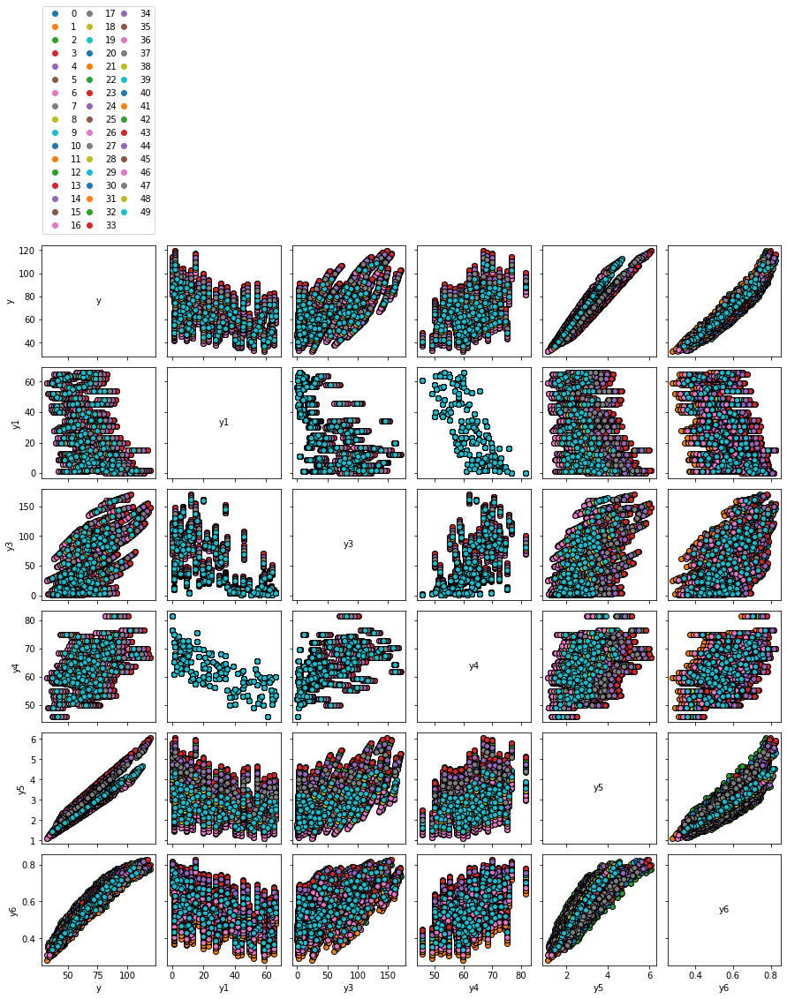

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
plt.show()

### Assign the address of outputs folders

In [6]:
import tarfile

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '7500_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '7500_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '7500_runs')

In [7]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'y.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'y1.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'y3.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'y4.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'y5.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'y6.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]

Make a database from the outputs of ema by concatinating the individual outs and experiments

In [8]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_87,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6
0,1.527510,927.649196,3.962532,-1.317091,2.555874,0.345571,1.070933,254.163231,91.942717,0,0,UZHModel,67.453332,4,14.252298,116.655352,132.985730,46.628263,91.853233,75.233030,125.690447,41.213003,79.313951,32.039804,56.985479,104.089374,97.614819,54.358138,93.383531,102.773625,133.875592,74.821247,67.084841,76.216286,...,44.668687,18.059969,59.079692,38.325528,99.834343,16.549325,36.875003,48.612276,39.678595,44.688014,70.748706,14.605417,82.217911,56.699311,51.995759,67.317334,15.059023,7.237593,50.348903,6.754675,36.445673,27.918712,42.600300,43.213332,39.346565,56.760728,25.822106,113.150979,71.787325,54.942179,95.487532,72.754407,2.757797,0.565292
1,1.028025,951.419392,3.082245,-1.771676,1.813646,0.740692,1.514430,254.163231,91.942717,1,0,UZHModel,49.584338,30,56.862159,52.985752,130.865879,43.005630,81.980820,36.417777,108.786375,52.979260,96.333482,93.400888,55.114424,104.763494,101.116853,95.935057,66.529765,59.881242,73.893628,124.072100,41.401189,93.951981,...,32.187465,27.077127,22.086633,31.485475,22.046777,9.043086,26.687338,4.407601,57.539243,30.417618,5.603761,65.516188,21.701565,67.388465,10.892606,20.288733,56.439536,16.041266,17.624855,22.201048,7.722596,43.638924,69.769533,27.022910,71.464038,13.185621,63.196149,17.431829,2.078349,69.651095,27.042110,61.279492,2.022542,0.444041
2,1.513170,1014.895056,3.123305,-1.392781,0.943520,0.126438,0.530079,254.163231,91.942717,2,0,UZHModel,48.410585,1,47.068610,111.581657,96.627610,45.947441,116.530529,91.510837,131.677580,50.200062,74.029158,38.645558,136.859918,106.242680,93.758963,52.733513,65.482210,101.266165,40.383339,74.293988,65.364569,69.904486,...,31.542249,25.777214,19.705958,34.527850,5.329174,15.741931,52.175446,109.802951,20.236955,58.028338,28.069678,17.985764,61.188788,5.244307,10.527093,30.204015,83.332943,29.350154,14.251786,3.566606,9.486305,7.183966,63.620847,26.143632,40.382356,49.691019,66.186993,7.656969,63.606053,40.484219,40.659658,60.973983,1.969831,0.423790
3,1.297164,911.984418,3.235028,-1.160138,1.438118,0.262378,2.758131,254.163231,91.942717,3,0,UZHModel,41.342240,44,48.970144,64.859382,67.487910,49.293873,86.174896,108.256460,104.263647,114.874164,59.971735,60.783890,9.755306,9.825064,126.063542,105.869346,38.704300,125.353368,48.865015,97.690819,89.401420,72.257785,...,33.467311,26.705043,22.440067,17.789277,17.652711,6.681454,4.561517,81.134759,2.783251,3.453371,13.325649,4.259192,13.081396,1.003135,5.249068,1.875370,8.766610,18.728594,18.410059,29.669476,6.009012,2.077130,8.592313,28.708716,8.374618,3.242208,35.538697,39.121434,6.193303,7.581034,1.457095,61.390085,1.696356,0.362847
4,1.068425,957.647507,4.716624,-1.226547,2.053561,0.227502,1.118137,254.163231,91.942717,4,0,UZHModel,80.667740,3,45.106997,106.963094,102.231585,140.965270,136.014218,128.528343,86.231541,102.637813,113.781420,92.379071,132.754566,111.683754,106.825884,90.507693,83.809233,103.715992,128.159116,107.258391,97.697787,65.938188,...,60.605382,30.915369,18.454007,31.346706,103.182769,57.125572,118.339297,104.368243,83.857956,75.018561,105.184724,73.169167,63.911369,91.087867,39.326145,81.886188,68.054870,71.833955,18.122724,28.391676,96.914376,69.012522,41.494358,97.957354,18.136258,86.819564,54.013281,12.516681,59.849097,72.615972,94.740288,72.439915,3.302203,0.664237


In [9]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values

In [10]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [11]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [12]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

7500
7500
7500
7500


In [13]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [14]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [15]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(7500, 119, 2)
(7500, 119, 2)
(7500, 119, 2)
(7500, 119, 2)


#### Check the header of outputs

In [16]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_Ver1_45_19
Money_sc_Ver1_45_19
ArtSnowPossibility_sc_Ver1_45_19
isOverSnow_sc_Ver1_45_19


In [17]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [18]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
7500
1785000
<U47
str1504
#########
(2500, 119, 2)
(2500, 119, 2)
(2500, 119, 2)
7500
#########
(2500, 119, 2)
(2500, 119, 2)
(2500, 119, 2)
7500
#########
(2500, 119, 2)
(2500, 119, 2)
(2500, 119, 2)
7500
#########
(2500, 119, 2)
(2500, 119, 2)
(2500, 119, 2)
7500


In [19]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [20]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [21]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[25.6061077]
[45.72462927]
[68.30624151]
[87.90158419]
[104.74462038]
(118, 1)
[0.98]
[1.82]
[2.86]
[3.9]
[4.851]
(118, 1)
[51.639]
[58.21]
[66.365]
[72.97]
[83.191]
(118, 1)
[29.54848178]
[53.38775821]
[80.33006934]
[100.]
[100.]
(118, 1)


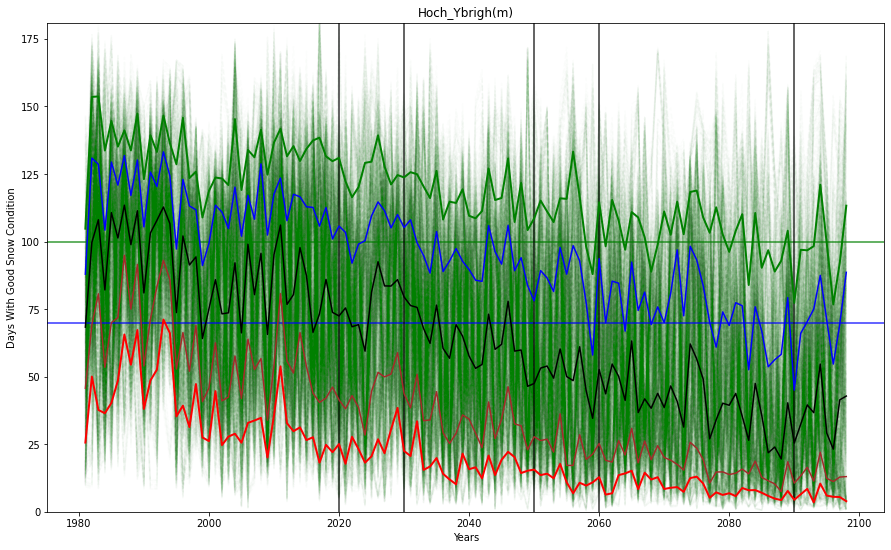

In [22]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

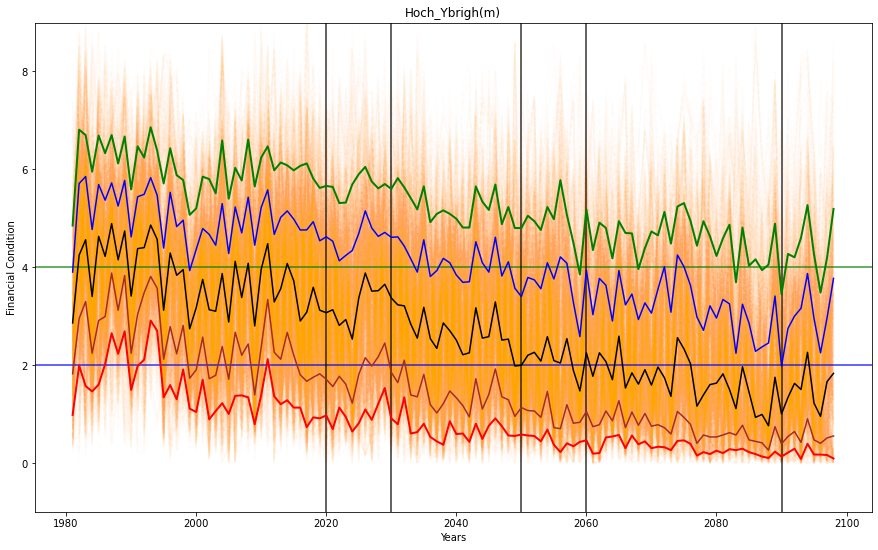

In [23]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

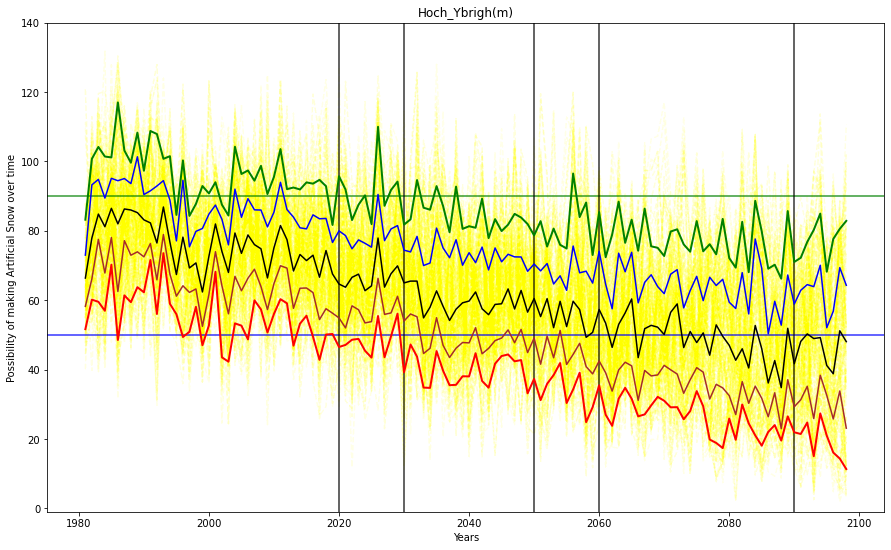

In [24]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=0.01)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

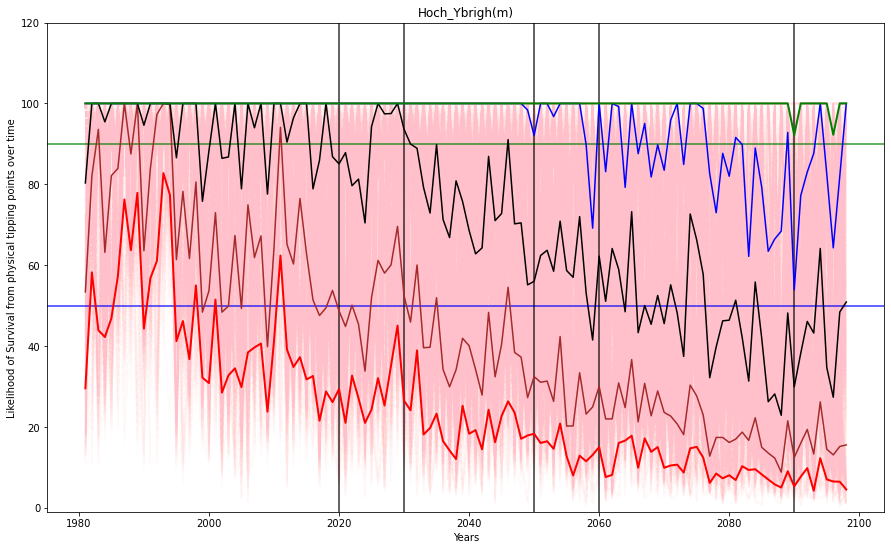

In [25]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

In [26]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['y'] < 80
prim_alg = prim.Prim(x, y, threshold=0.8)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 7500 points remaining, containing 5847 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.3082666666666667, coverage: 0.39541645288181976, density: 1.0 restricted_dimensions: 7


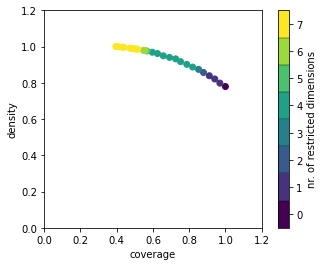

In [27]:
#import mpld3
box1.show_tradeoff()
plt.show()
#mpld3.display()
fig.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage    0.567299
density     0.975588
id                14
mass        0.453333
mean        0.975588
res_dim            5
Name: 14, dtype: object

                 box 14            \
                    min       max   
X5temp         3.015468  5.362836   
Xfactor1       1.200621  3.476789   
xRCP           0.840838  3.291591   
xClimateModel  0.042977  0.996545   
X2fM           1.072114  1.606999   

                                                                
                                                     qp values  
X5temp                          [-1.0, 3.0472377453902936e-48]  
Xfactor1                        [1.8007014181808762e-49, -1.0]  
xRCP           [5.2081313137498796e-17, 0.0056311648782253485]  
xClimateModel                    [6.510211024717954e-06, -1.0]  
X2fM                              [0.011702784033701152, -1.0]  



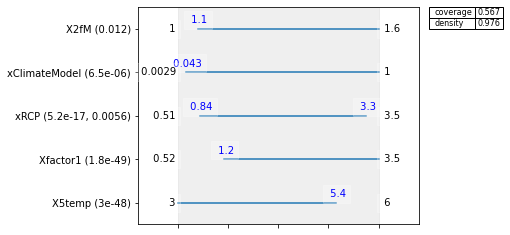

In [28]:
# Saeed : explore the inspect effect
box1.inspect(14)
box1.inspect(14, style='graph')
plt.show()

policy [0, 1, 2, 3, 4, 5, 6, 7, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 44, 45, 46, 47, 48, 49, 9, 10, 42, 43, 22, 30]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


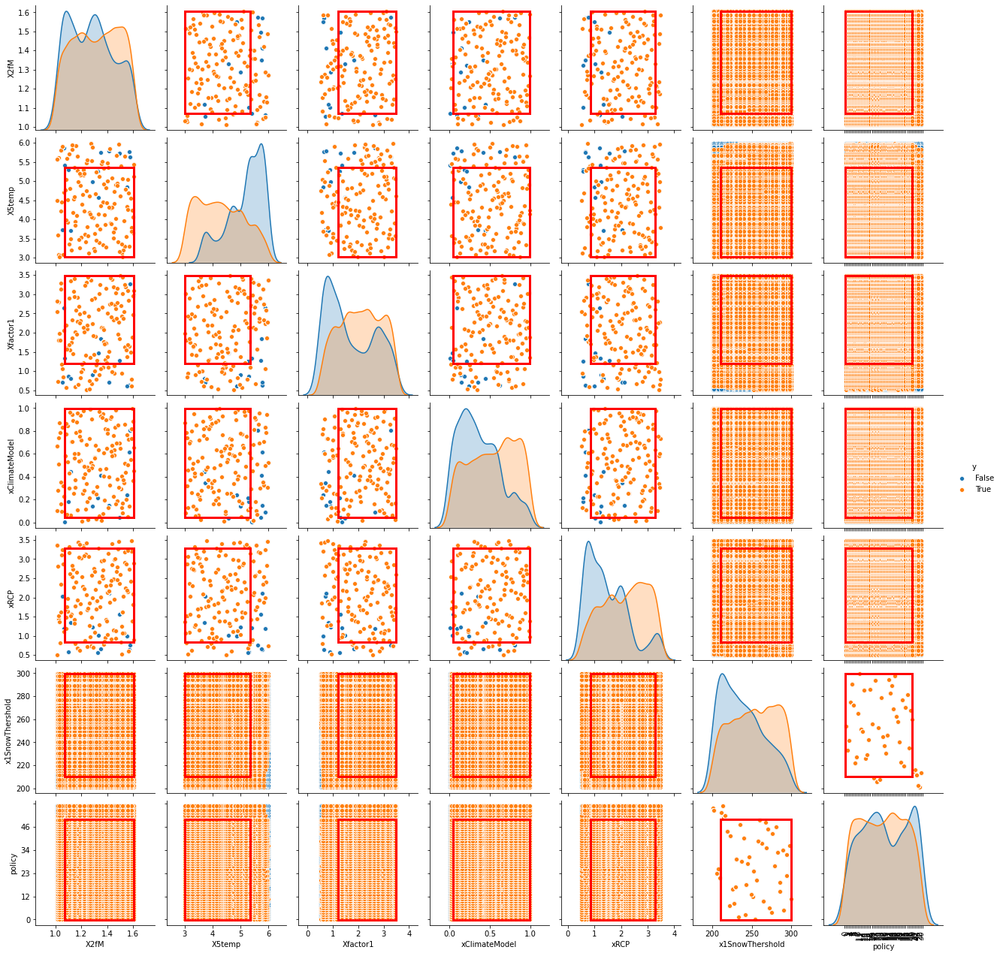

In [29]:
# fig, axs = plt.subplots()
axs = box1.show_pairs_scatter(21)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays.svg'), format='svg', dpi=600)

In [30]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 5188 points remaining, containing 3535 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] past

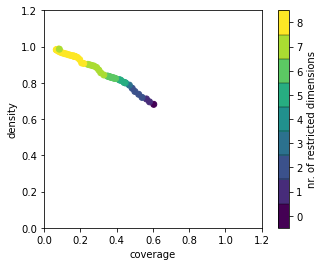

In [31]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

### likelihood of survival analysis

In [32]:
x = experiments
y = outcomes['y6'] < 0.6
prim_alg = prim.Prim(x, y, threshold=0.8)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 7500 points remaining, containing 4445 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEB

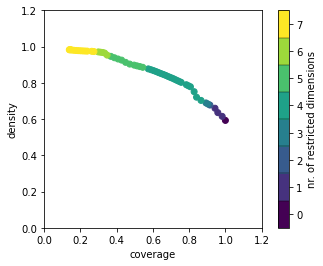

In [33]:
box1.show_tradeoff()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

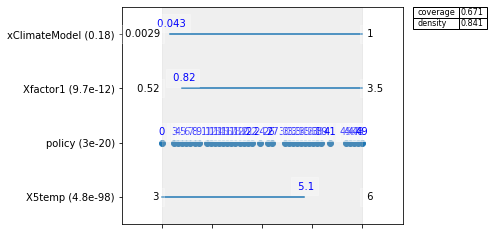

In [34]:
# Saeed : explore the inspect effect
box1.inspect(20, style='graph')
plt.show()

policy [0, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 24, 26, 27, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 41, 45, 46, 47, 48, 49, 1, 2, 40, 10, 42, 43, 44, 20, 23, 25, 28, 29]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


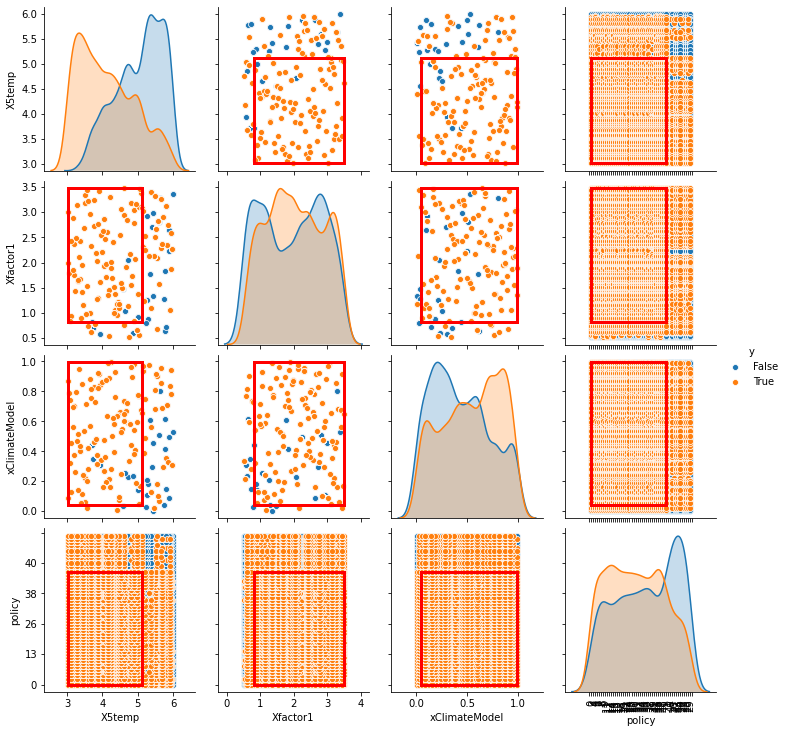

In [35]:
#fig, axs = plt.subplots()
axs = box1.show_pairs_scatter(21)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Artifical snow analysis

In [36]:
x = experiments
y = outcomes['y4'] < 60
prim_alg = prim.Prim(x, y, threshold=0.8)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 7500 points remaining, containing 2750 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.8461538461538461, mass: 0.26, coverage: 0.6, density: 0.8461538461538461 restricted_dimensions:

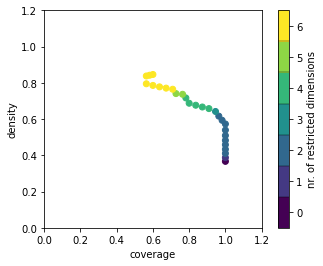

In [37]:
box1.show_tradeoff()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

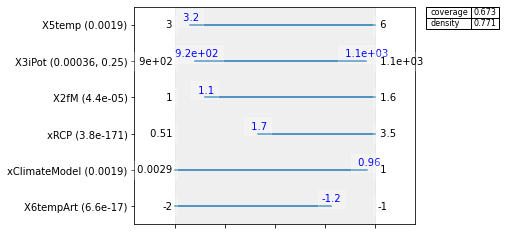

In [39]:
# Saeed : explore the inspect effect
box1.inspect(20, style='graph')
plt.show()

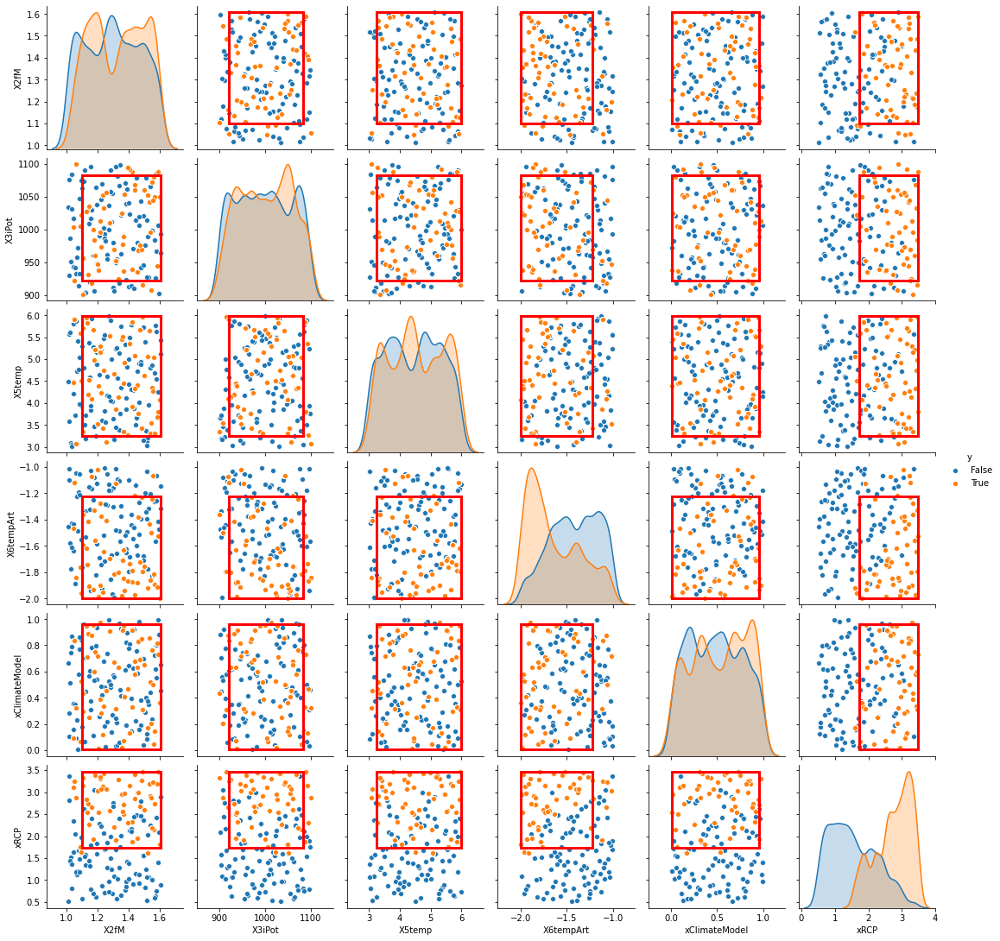

In [40]:
#fig, axs = plt.subplots()
axs = box1.show_pairs_scatter(21)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial.svg'), format='svg', dpi=600)

### Visualization with ema-workbench - part3

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


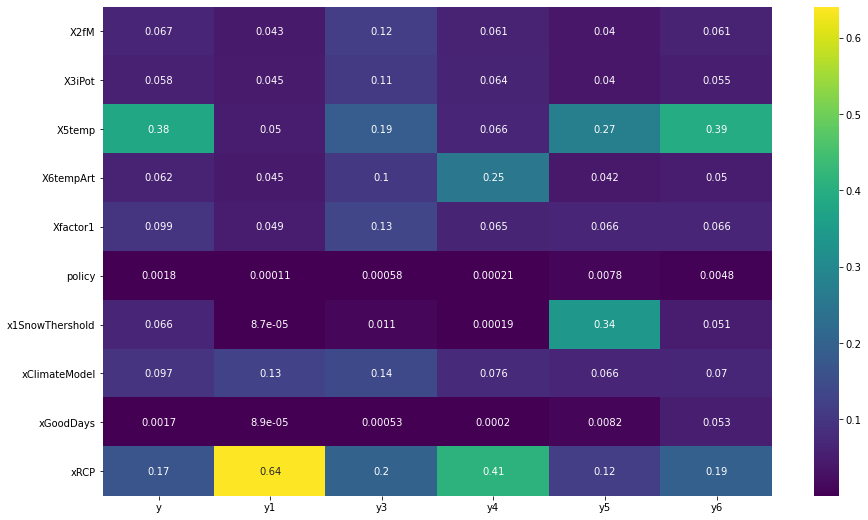

In [41]:
from ema_workbench.analysis import feature_scoring

fig, ax = plt.subplots(figsize=(15,9))

x = experiments
Y = outcomes

fs = feature_scoring.get_feature_scores_all(x, Y)
ax = sns.heatmap(fs, cmap='viridis', annot=True)
plt.show()

fig.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=600)

In [42]:
x = experiments
Y = outcomes['y'] < 70
#fs, alg = feature_scoring.get_ex_feature_scores(x, y, mode=feature_scoring.CLASSIFICATION)
fs, alg = feature_scoring.get_ex_feature_scores(x, Y)

fs.sort_values(ascending=False, by=1)

[MainProcess/INFO] model dropped from analysis because only a single category


,1
0,
X5temp,0.343571
xRCP,0.135299
x1SnowThershold,0.102587
Xfactor1,0.098376
xClimateModel,0.083114
X2fM,0.077453
X3iPot,0.074141
X6tempArt,0.072112
policy,0.007011


[MainProcess/INFO] model dropped from analysis because only a single category


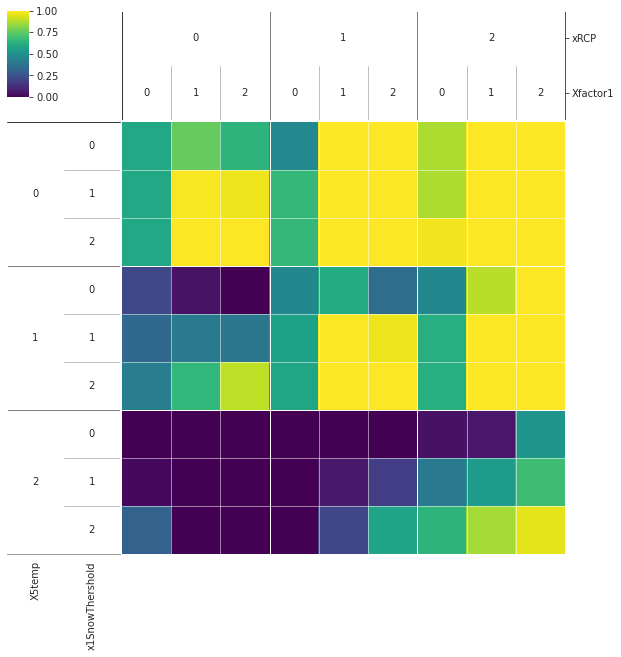

In [43]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['y'] < 70
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


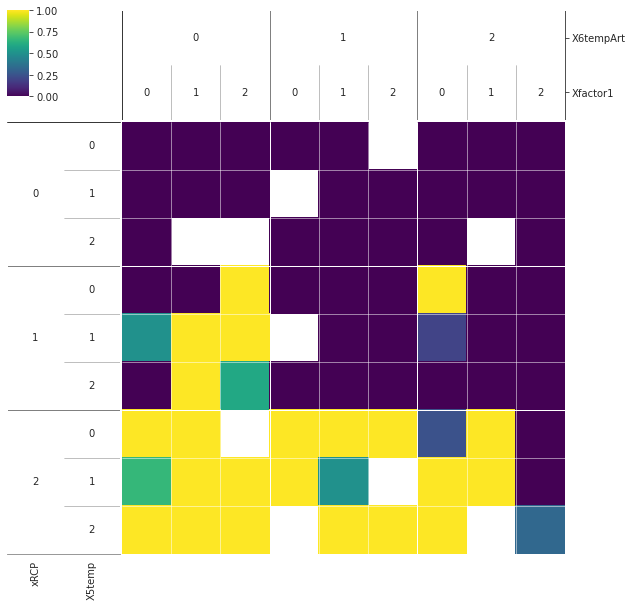

In [44]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['y4'] < 60
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


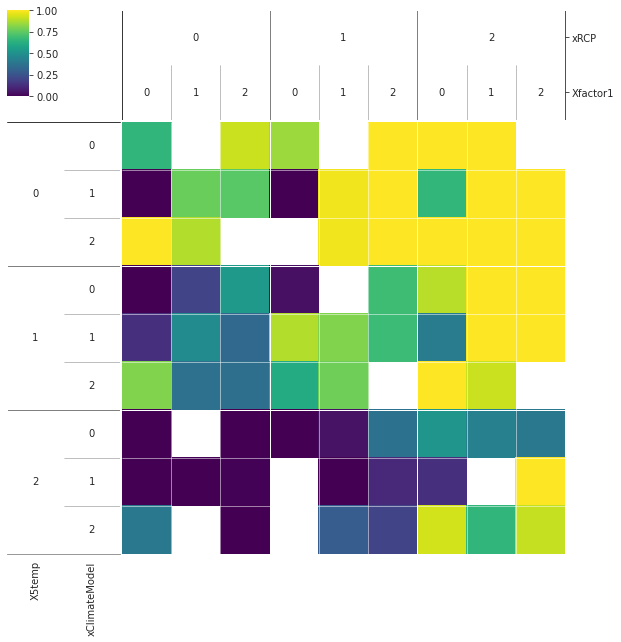

In [45]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['y6'] < 0.6
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

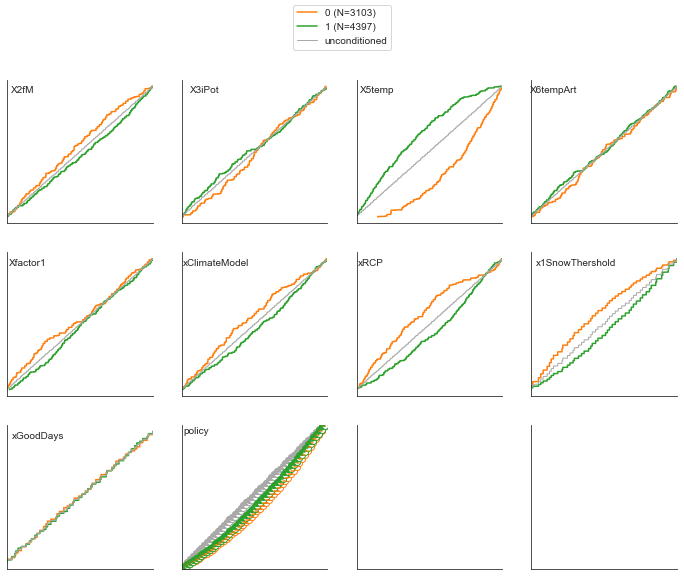

In [46]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['y'] < 70
fig = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

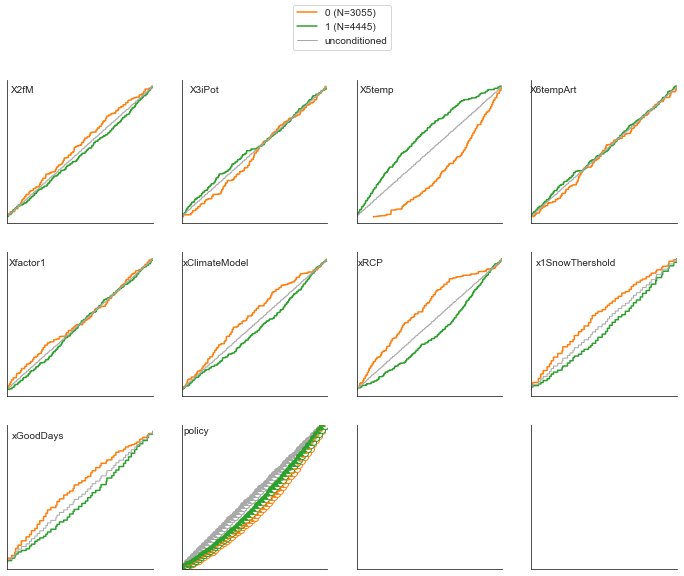

In [47]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['y6'] < 0.6
fig = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

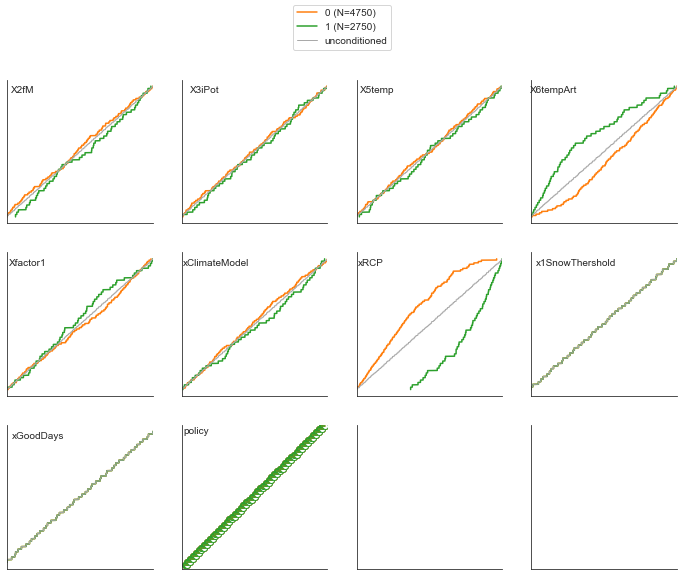

In [48]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['y4'] < 60
fig = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

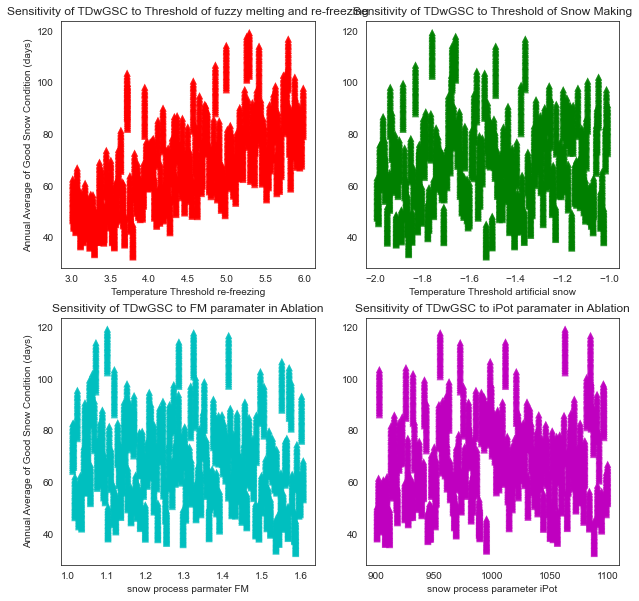

In [49]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing")
axs[0,1].set_xlabel("Temperature Threshold artificial snow")
axs[1,0].set_xlabel("snow process parmater FM")
axs[1,1].set_xlabel("snow process parameter iPot")


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing')
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making')
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation')
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation')


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

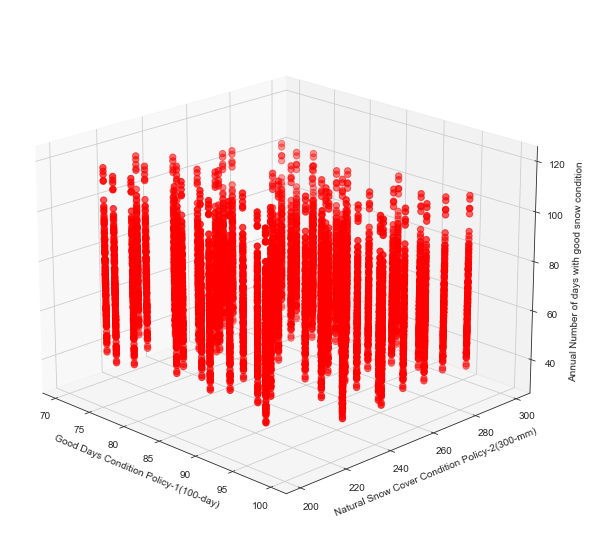

In [50]:
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)')
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)')
ax.set_zlabel('Annual Number of days with good snow condition')


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

### Defining the Q0.9 and Q0.1 databases

In [52]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[25.6061077]
[45.72462927]
[68.30624151]
[87.90158419]
[104.74462038]
(118, 1)
[0.98]
[1.82]
[2.86]
[3.9]
[4.851]
(118, 1)
[51.639]
[58.21]
[66.365]
[72.97]
[83.191]
(118, 1)
[29.54848178]
[53.38775821]
[80.33006934]
[100.]
[100.]
(118, 1)


In [53]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(2500, 119, 2)
(2500, 119, 2)
(2500, 119, 2)
7500
#########
(2500, 119, 2)
(2500, 119, 2)
(2500, 119, 2)
7500
#########
(2500, 119, 2)
(2500, 119, 2)
(2500, 119, 2)
7500
#########
(2500, 119, 2)
(2500, 119, 2)
(2500, 119, 2)
7500


In [54]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[600, 0, 1:2])
print(matrix_GoodDays[3333].shape)

(7500, 119, 1)
['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [55]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [56]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [57]:
dfq50_26.head()

,median26
0,74.196011
1,93.551537
2,104.377826
3,75.409539
4,114.061153


In [58]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [59]:
dfAllAverages.head()

,median26,median45,median85
0,74.196011,64.539664,65.228862
1,93.551537,104.343553,100.972169
2,104.377826,113.612992,102.994261
3,75.409539,75.077341,90.220370
4,114.061153,109.707978,107.262843


In [60]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[25.6061077]
[45.72462927]
[68.30624151]
[87.90158419]
[104.74462038]
(118, 1)
*** RCP2.6***
[33.63284917]
[52.1250477]
[74.19601061]
[89.66908388]
[104.7829535]
(118, 1)
*** RCP4.5***
[17.28661282]
[39.07806121]
[64.53966418]
[86.53024591]
[102.65947275]
(118, 1)
*** RCP8.5***
[28.24949356]
[44.24392979]
[65.22886184]
[87.34281221]
[106.02457004]
(118, 1)


In [61]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[0.98]
[1.82]
[2.86]
[3.9]
[4.851]
(118, 1)
*** RCP2.6***
[1.369]
[2.12]
[3.01]
[4.]
[4.97]
(118, 1)
*** RCP4.5***
[0.69]
[1.58]
[2.74]
[3.76]
[4.711]
(118, 1)
*** RCP8.5***
[1.149]
[1.79]
[2.72]
[3.88]
[4.85]
(118, 1)


### RCP 2.6 Number of days with Good Snow Condition over the time

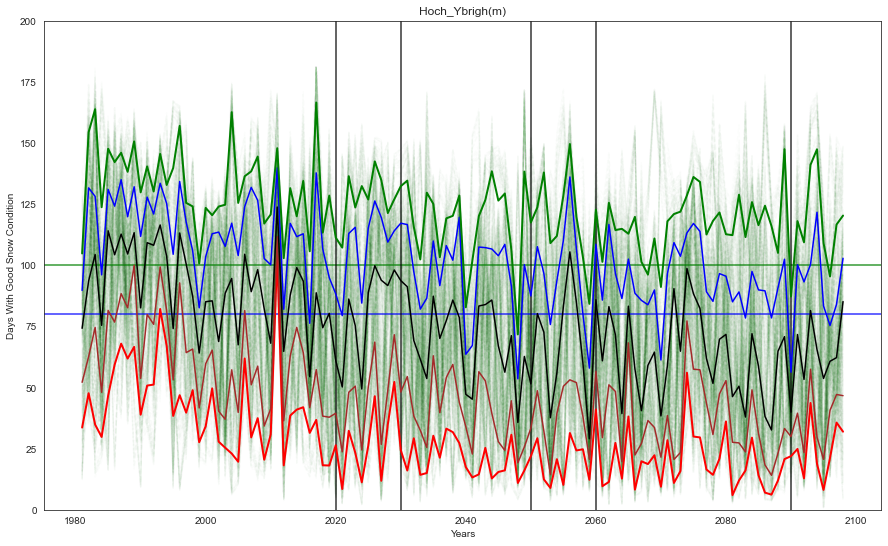

In [62]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), 5):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='green', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

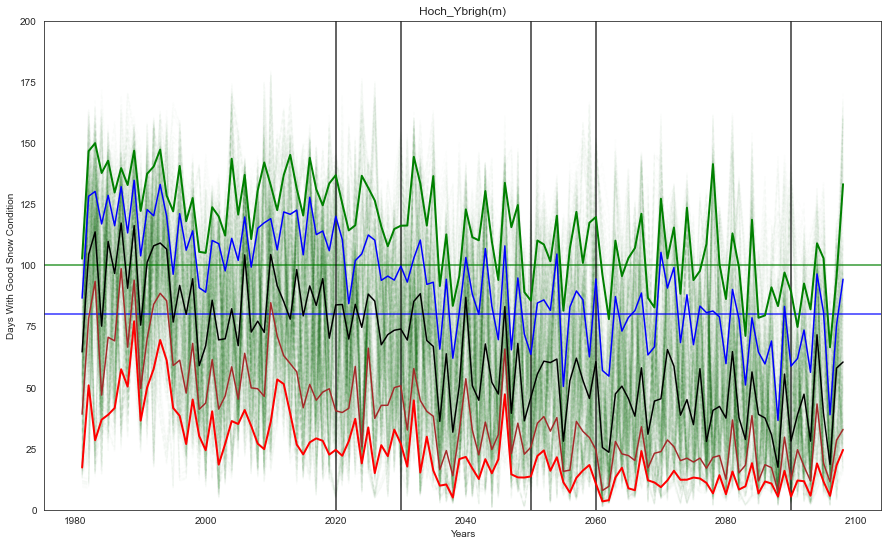

In [63]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), 5):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

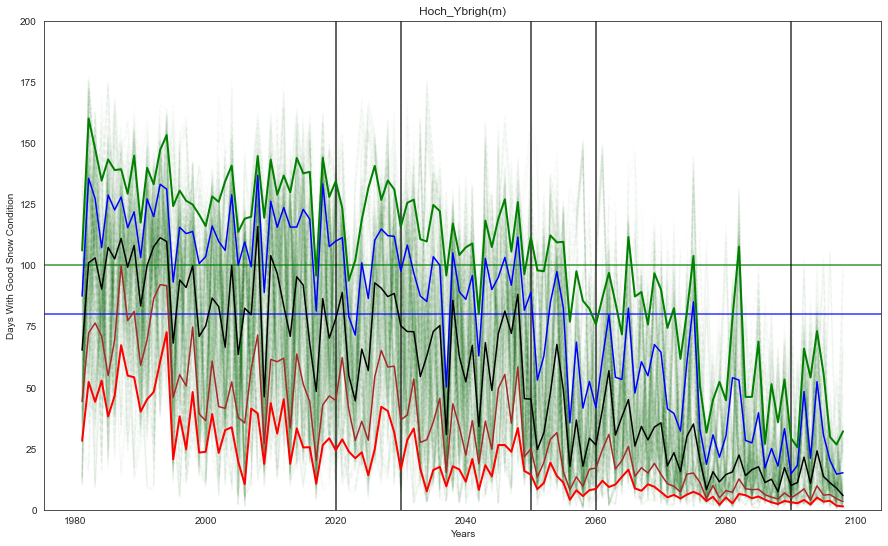

In [64]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), 5):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

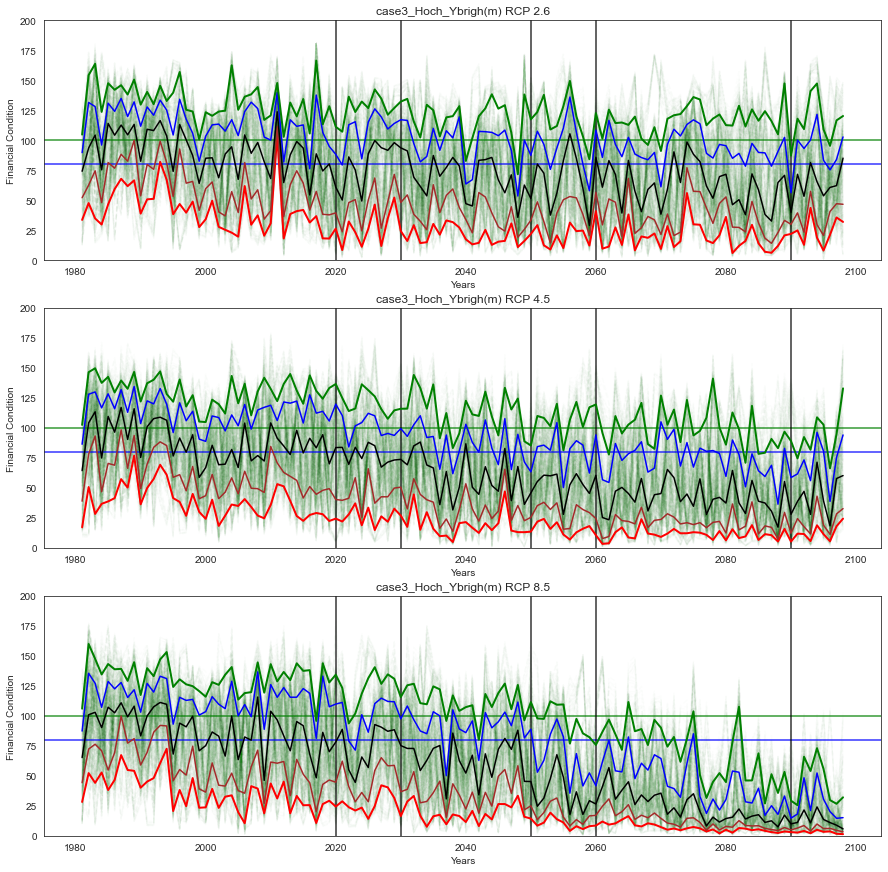

In [65]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays26), 5):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_GoodDays45), 5):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_GoodDays85), 5):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='green', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='green', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='green', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Financial Condition')

axs[1].set_ylim(bottom=0, top =200)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Condition')

axs[2].set_ylim(bottom=0, top =200)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Financial Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
plt.show()

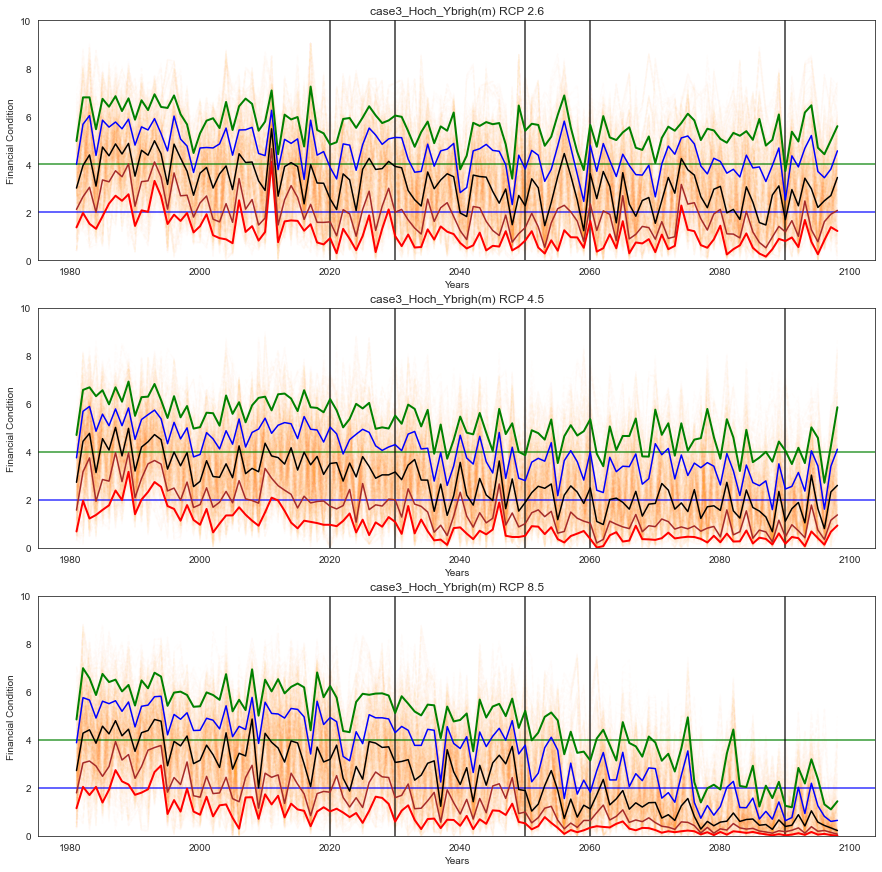

In [66]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_fin26), 5):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_fin45), 5):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_fin85), 5):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=4, color='green', alpha=0.8)
axs[0].axhline(y=2, color='blue', alpha=0.8)
axs[1].axhline(y=4, color='green', alpha=0.8)
axs[1].axhline(y=2, color='blue', alpha=0.8)
axs[2].axhline(y=4, color='green', alpha=0.8)
axs[2].axhline(y=2, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='brown',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='green', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='brown',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='green', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='brown',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='green', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Financial Condition')

axs[1].set_ylim(bottom=0, top =10)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Condition')

axs[2].set_ylim(bottom=0, top =10)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Financial Condition')


fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)

plt.show()

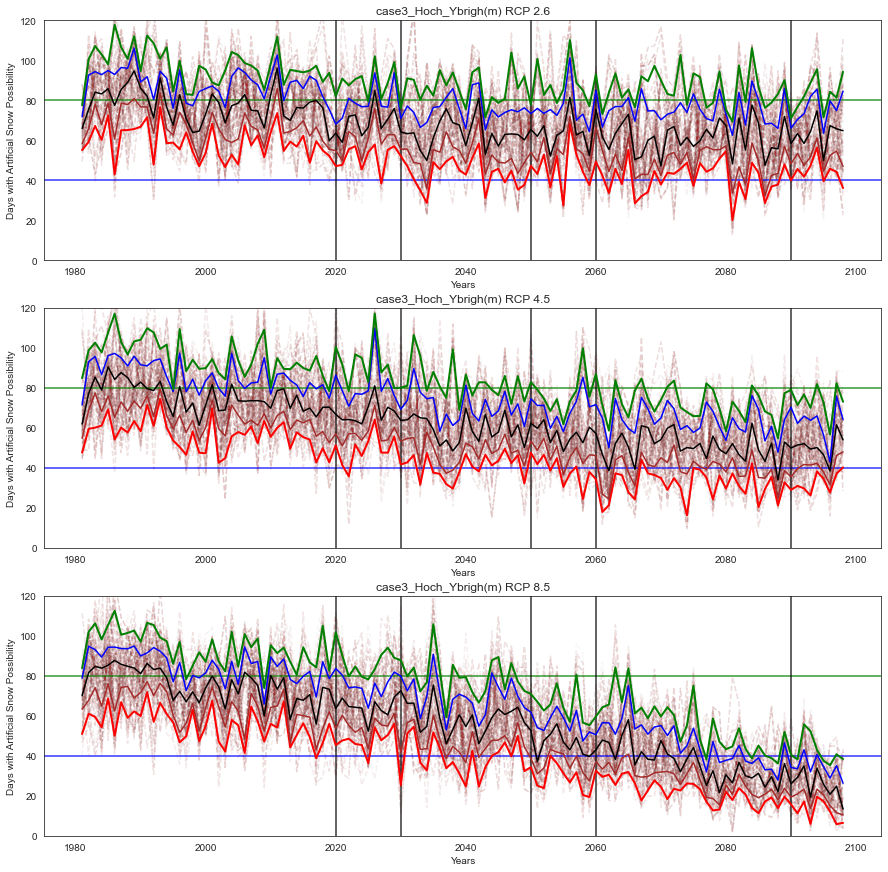

In [67]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), 5):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Art45), 5):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Art85), 5):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=40, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=40, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=40, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='brown',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='green', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='brown',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='green', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='brown',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='green', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =120)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Days with Artificial Snow Possibility')

axs[1].set_ylim(bottom=0, top =120)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Artificial Snow Possibility')

axs[2].set_ylim(bottom=0, top =120)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Days with Artificial Snow Possibility')


fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)

plt.show()

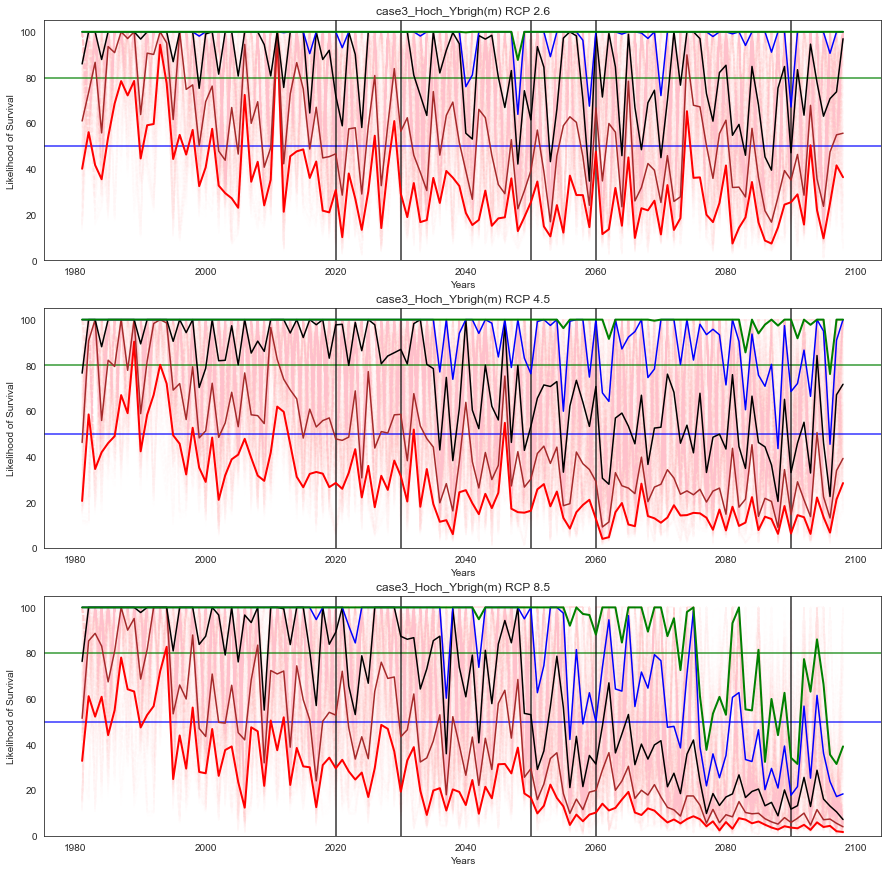

In [68]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), 5):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Like45), 5):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Like85), 5):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='brown',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='green', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='brown',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='green', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='brown',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='green', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Likelihood of Survival')

axs[1].set_ylim(bottom=0, top =105)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival')

axs[2].set_ylim(bottom=0, top =105)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Likelihood of Survival')


fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)

plt.show()

In [69]:
dfAllAverages.head()

,median26,median45,median85
0,74.196011,64.539664,65.228862
1,93.551537,104.343553,100.972169
2,104.377826,113.612992,102.994261
3,75.409539,75.077341,90.220370
4,114.061153,109.707978,107.262843


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [70]:
y_axis = np.arange(1981, 2100, step= 20)

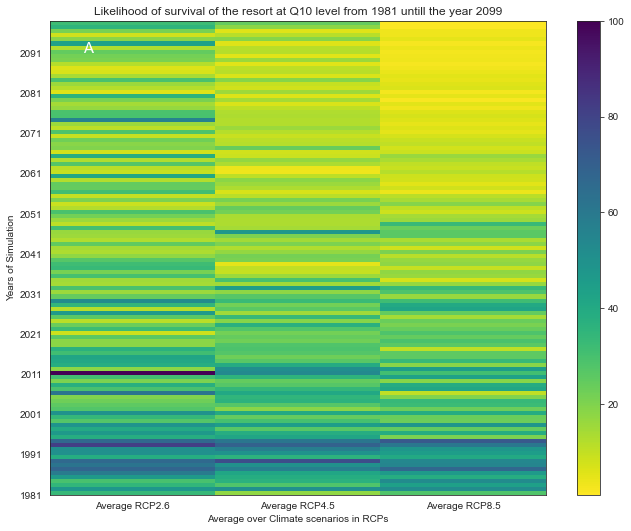

In [71]:
from matplotlib.ticker import FuncFormatter


fig, (ax3) = plt.subplots(1, 1, figsize=(9.5,7.5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='viridis_r', vmin=1, vmax=100)
cb3 = fig.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


ax3.set_xlabel("Average over Climate scenarios in RCPs")

ax3.set_ylabel("Years of Simulation")
plt.xticks(x_axis, ('Average RCP2.6', 'Average RCP4.5', 'Average RCP8.5'))
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099))

ax3.text(0.2, 110, 'A', color = 'white', fontsize=15)

fig.savefig(os.path.join(rootVisualization, 'Likelihood_All.svg'), format='svg', dpi=300)


fig.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

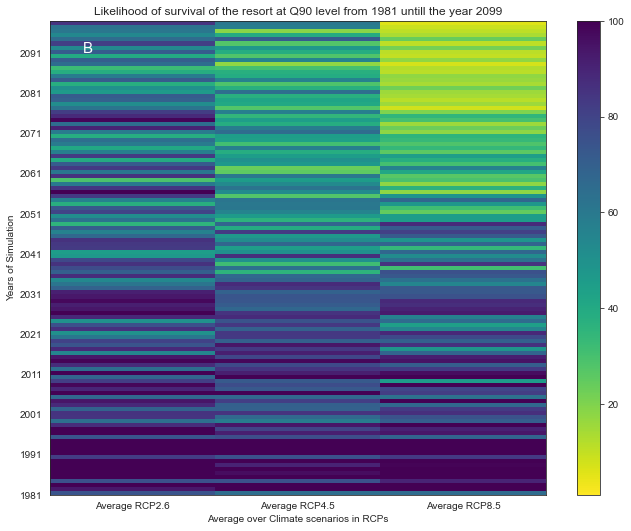

In [72]:
from matplotlib.ticker import FuncFormatter


fig, (ax4) = plt.subplots(1, 1, figsize=(9.5,7.5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='viridis_r' ,vmin=1, vmax=100)
cb4 = fig.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


ax4.set_xlabel("Average over Climate scenarios in RCPs")

ax4.set_ylabel("Years of Simulation")
plt.xticks(x_axis, ('Average RCP2.6', 'Average RCP4.5', 'Average RCP8.5'))
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
plt.title("Likelihood of survival of the resort at Q90 level from {} untill the year {}".format(1981, 2099))

ax4.text(0.2, 110, 'B', color = 'white', fontsize=15)


fig.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)


fig.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

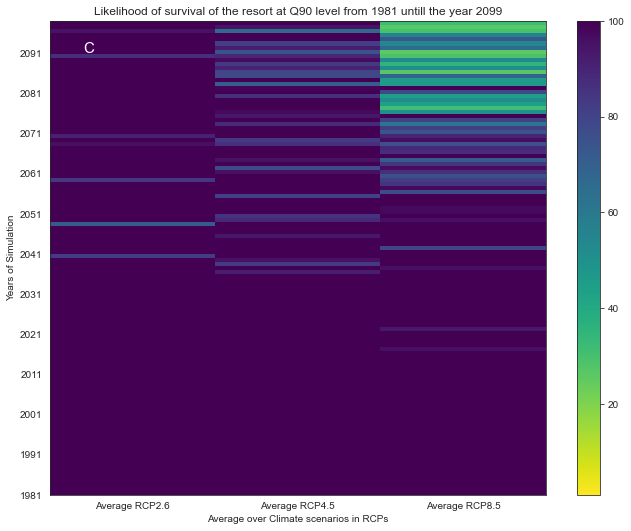

In [73]:
from matplotlib.ticker import FuncFormatter


fig, (ax4) = plt.subplots(1, 1, figsize=(9.5,7.5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='viridis_r' ,vmin=1, vmax=100)
cb4 = fig.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


ax4.set_xlabel("Average over Climate scenarios in RCPs")

ax4.set_ylabel("Years of Simulation")
plt.xticks(x_axis, ('Average RCP2.6', 'Average RCP4.5', 'Average RCP8.5'))
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
plt.title("Likelihood of survival of the resort at Q90 level from {} untill the year {}".format(1981, 2099))

ax4.text(0.2, 110, 'C', color = 'white', fontsize=15)


fig.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)


fig.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [74]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(2500, 119, 2)
(2500, 119, 2)
(2500, 119, 2)
(7500, 119, 2)


In [75]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [76]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [77]:
df26_all.head(7)

,Season,sc_1_['isOverSnow_sc_Ver2_26_5'],sc_2_['isOverSnow_sc_Ver1_26_11'],sc_3_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_4_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_5_['isOverSnow_sc_Ver2_26_10'],sc_6_['isOverSnow_sc_Ver1_26_12'],sc_7_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_8_['isOverSnow_sc_Ver1_26_3'],sc_9_['isOverSnow_sc_Ver2_26_2'],sc_10_['isOverSnow_sc_Ver2_26_2'],sc_11_['isOverSnow_sc_Ver1_26_11'],sc_12_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_13_['isOverSnow_sc_Ver2_26_3'],sc_14_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_15_['isOverSnow_sc_Ver2_26_8'],sc_16_['isOverSnow_sc_Ver2_26_5'],sc_17_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_18_['isOverSnow_sc_Ver1_26_4'],sc_19_['isOverSnow_sc_Ver2_26_3'],sc_20_['isOverSnow_sc_Ver1_26_11'],sc_21_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_22_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_23_['isOverSnow_sc_Ver1_26_4'],sc_24_['isOverSnow_sc_Ver2_26_4'],sc_25_['isOverSnow_sc_Ver2_26_6'],sc_26_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_27_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_28_['isOverSnow_sc_Ver2_26_6'],sc_29_['isOverSnow_sc_Ver2_26_7'],sc_30_['isOverSnow_sc_Ver2_26_7'],sc_31_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_32_['isOverSnow_sc_Ver1_26_8'],sc_33_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],...,sc_2467_['isOverSnow_sc_Ver2_26_4'],sc_2468_['isOverSnow_sc_Ver2_26_6'],sc_2469_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2470_['isOverSnow_sc_Ver2_26_6'],sc_2471_['isOverSnow_sc_Ver2_26_7'],sc_2472_['isOverSnow_sc_Ver2_26_7'],sc_2473_['isOverSnow_sc_Ver1_26_11'],sc_2474_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2475_['isOverSnow_sc_Ver1_26_8'],sc_2476_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2477_['isOverSnow_sc_Ver2_26_12'],sc_2478_['isOverSnow_sc_Ver1_26_10'],sc_2479_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2480_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2481_['isOverSnow_sc_Ver2_26_9'],sc_2482_['isOverSnow_sc_Ver1_26_5'],sc_2483_['isOverSnow_sc_Ver1_26_6'],sc_2484_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2485_['isOverSnow_sc_Ver2_26_6'],sc_2486_['isOverSnow_sc_Ver2_26_7'],sc_2487_['isOverSnow_sc_Ver1_26_10'],sc_2488_['isOverSnow_sc_Ver2_26_8'],sc_2489_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2490_['isOverSnow_sc_Ver1_26_6'],sc_2491_['isOverSnow_sc_Ver2_26_2'],sc_2492_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2493_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver2_26_7'],sc_2495_['isOverSnow_sc_Ver1_26_8'],sc_2496_['isOverSnow_sc_Ver1_26_11'],sc_2497_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2498_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2499_['isOverSnow_sc_Ver1_26_6'],sc_2500_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp']
0,1981-1982,14.252297553566095,58.78424090478251,132.88896720917745,80.3975589794783,136.5395624537052,34.3296084535804,97.70617605236149,30.591140269289976,85.62990393269094,57.20430512413728,37.32472544766984,77.41665853738922,90.5214568525714,100.06983640744778,59.73508361168701,15.9321677933297,52.616428248061496,50.42360609465524,82.60255414594103,64.63283362069164,98.9852635162791,98.38265432066709,33.06342318455567,67.86120151218161,120.65138656537692,126.18105858026603,94.89248826251284,88.32916517457079,79.99789424281005,47.81735095807673,53.35597329453751,103.91771085475139,62.35902047874785,...,69.23628484651742,122.33880680401178,95.67697716419937,90.46577678288236,81.36786458391754,48.97401429723335,44.84409464202877,54.43404037259353,105.51220737158405,63.86488552669316,82.29791394696969,93.5827826271603,81.63033196764277,73.97038052857933,70.87068445143015,18.589230336409667,109.83835335780283,75.48416779283176,103.35571709723239,79.72697230954364,90.58289074359305,60.890742003676266,106.779877486251,126.77648998034806,86.02468819101851,92.02151696657806,44.95461416860898,77.4578757437299,95.8418879791556

In [78]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_sc_Ver2_45_1'], dtype='<U47')

In [79]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [80]:
df45_all.head(7)

,Season,sc_1_['isOverSnow_sc_Ver1_45_19'],sc_2_['isOverSnow_sc_Ver2_45_23'],sc_3_['isOverSnow_sc_Ver2_45_1'],sc_4_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_5_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_6_['isOverSnow_sc_Ver1_45_10'],sc_7_['isOverSnow_sc_Ver1_45_2'],sc_8_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_9_['isOverSnow_sc_Ver1_45_12'],sc_10_['isOverSnow_sc_Ver2_45_6'],sc_11_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_12_['isOverSnow_sc_Ver2_45_12'],sc_13_['isOverSnow_sc_Ver2_45_23'],sc_14_['isOverSnow_sc_Ver2_45_23'],sc_15_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_16_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_17_['isOverSnow_sc_Ver2_45_12'],sc_18_['isOverSnow_sc_Ver2_45_10'],sc_19_['isOverSnow_sc_Ver1_45_19'],sc_20_['isOverSnow_sc_Ver2_45_4'],sc_21_['isOverSnow_sc_Ver1_45_17'],sc_22_['isOverSnow_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_23_['isOverSnow_sc_Ver2_45_17'],sc_24_['isOverSnow_sc_Ver1_45_5'],sc_25_['isOverSnow_sc_Ver1_45_18'],sc_26_['isOverSnow_sc_Ver2_45_8'],sc_27_['isOverSnow_sc_Ver2_45_11'],sc_28_['isOverSnow_sc_Ver2_45_12'],sc_29_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_30_['isOverSnow_sc_Ver1_45_9'],sc_31_['isOverSnow_sc_Ver2_45_1'],sc_32_['isOverSnow_sc_Ver2_45_22'],sc_33_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],...,sc_2467_['isOverSnow_sc_Ver1_45_19'],sc_2468_['isOverSnow_sc_Ver2_45_4'],sc_2469_['isOverSnow_sc_Ver1_45_17'],sc_2470_['isOverSnow_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2471_['isOverSnow_sc_Ver2_45_17'],sc_2472_['isOverSnow_sc_Ver1_45_5'],sc_2473_['isOverSnow_sc_Ver1_45_18'],sc_2474_['isOverSnow_sc_Ver2_45_8'],sc_2475_['isOverSnow_sc_Ver2_45_11'],sc_2476_['isOverSnow_sc_Ver2_45_12'],sc_2477_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_2478_['isOverSnow_sc_Ver1_45_9'],sc_2479_['isOverSnow_sc_Ver2_45_22'],sc_2480_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_2481_['isOverSnow_sc_Ver1_45_9'],sc_2482_['isOverSnow_sc_Ver2_45_1'],sc_2483_['isOverSnow_sc_Ver1_45_13'],sc_2484_['isOverSnow_sc_Ver1_45_19'],sc_2485_['isOverSnow_sc_Ver2_45_20'],sc_2486_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_2487_['isOverSnow_sc_Ver2_45_4'],sc_2488_['isOverSnow_sc_Ver1_45_21'],sc_2489_['isOverSnow_sc_Ver1_45_23'],sc_2490_['isOverSnow_sc_Ver2_45_9'],sc_2491_['isOverSnow_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2492_['isOverSnow_sc_Ver1_45_9'],sc_2493_['isOverSnow_sc_Ver2_45_24'],sc_2494_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_2495_['isOverSnow_sc_Ver2_45_2'],sc_2496_['isOverSnow_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2497_['isOverSnow_sc_Ver1_45_17'],sc_2498_['isOverSnow_sc_Ver1_45_15'],sc_2499_['isOverSnow_sc_Ver1_45_24'],sc_2500_['isOverSnow_sc_Ver2_45_20']
0,1981-1982,56.86215871877469,18.633015171997823,18.80527156221283,57.05803732139166,80.14390423750632,65.23593647452694,107.88603915363576,86.6640309015293,95.31594745138929,106.44059008520861,89.68699539996638,97.56874031843212,18.44292051543204,16.274698659041196,77.95641625780183,71.76109322259174,85.73351305302715,36.372540412009414,63.56430957139171,39.83369615962703,18.447203780216796,21.515492266606444,93.08283229626244,69.05607059444422,19.16147523199525,115.49980301987726,88.1575419200116,86.68674342724812,81.39868840502753,97.81080543134564,16.425153151616126,57.53504924530824,57.546220732300334,...,65.10187920013364,40.79724129727682,18.893426833042046,22.03593475516066,94.7578799512807,70.22313740454192,19.624975937930163,116.39976929624218,89.6975902089778,87.53909396825516,82.83332921499745,98.76165185757296,58.92677590613824,58.938217622433946,95.39558600493076,46.21403808685798,117.55777608535654,70.46250046990423,85.24061524459846,53.70583967739772,41.35793044189145,15.822587299216357,123.7656189160187,37.77072715256502,69.66474258451665,90.25021615410989,61.33678875469859,58.14738781421862,144.63946876520674,27.913913794486017,12.243176989886521,103.2167198024132,67.81068301006859,83.57084540346585
1,1982-1983,52.98575222650145,24.010666877

In [81]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [82]:
df85_all.head(7)

,Season,sc_1_['isOverSnow_sc_Ver1_85_13'],sc_2_['isOverSnow_sc_Ver1_85_13'],sc_3_['isOverSnow_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_4_['isOverSnow_sc_Ver1_85_30'],sc_5_['isOverSnow_sc_Ver2_85_9'],sc_6_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_7_['isOverSnow_sc_Ver1_85_4'],sc_8_['isOverSnow_sc_Ver1_85_27'],sc_9_['isOverSnow_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_10_['isOverSnow_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_11_['isOverSnow_sc_Ver2_85_17'],sc_12_['isOverSnow_sc_Ver1_85_23'],sc_13_['isOverSnow_sc_Ver1_85_30'],sc_14_['isOverSnow_SMHI-RCA-IPSL-EUR11-RCP85-pcp'],sc_15_['isOverSnow_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_16_['isOverSnow_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_17_['isOverSnow_sc_Ver1_85_21'],sc_18_['isOverSnow_CLMCOM-CCLM5-MPIESM-EUR44-RCP85-pcp'],sc_19_['isOverSnow_sc_Ver2_85_9'],sc_20_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_21_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_22_['isOverSnow_sc_Ver1_85_14'],sc_23_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_24_['isOverSnow_sc_Ver1_85_16'],sc_25_['isOverSnow_sc_Ver1_85_9'],sc_26_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_27_['isOverSnow_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_28_['isOverSnow_sc_Ver1_85_1'],sc_29_['isOverSnow_sc_Ver2_85_3'],sc_30_['isOverSnow_sc_Ver1_85_4'],sc_31_['isOverSnow_sc_Ver1_85_29'],sc_32_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_33_['isOverSnow_sc_Ver2_85_21'],...,sc_2467_['isOverSnow_sc_Ver1_85_9'],sc_2468_['isOverSnow_sc_Ver2_85_3'],sc_2469_['isOverSnow_sc_Ver2_85_27'],sc_2470_['isOverSnow_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_2471_['isOverSnow_sc_Ver1_85_1'],sc_2472_['isOverSnow_sc_Ver2_85_3'],sc_2473_['isOverSnow_sc_Ver1_85_29'],sc_2474_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_2475_['isOverSnow_sc_Ver2_85_21'],sc_2476_['isOverSnow_sc_Ver2_85_20'],sc_2477_['isOverSnow_sc_Ver2_85_26'],sc_2478_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_2479_['isOverSnow_sc_Ver1_85_16'],sc_2480_['isOverSnow_sc_Ver1_85_26'],sc_2481_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2482_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2483_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2484_['isOverSnow_sc_Ver1_85_13'],sc_2485_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_2486_['isOverSnow_sc_Ver1_85_30'],sc_2487_['isOverSnow_sc_Ver1_85_22'],sc_2488_['isOverSnow_sc_Ver1_85_9'],sc_2489_['isOverSnow_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_2490_['isOverSnow_sc_Ver2_85_20'],sc_2491_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_2492_['isOverSnow_sc_Ver1_85_6'],sc_2493_['isOverSnow_sc_Ver2_85_6'],sc_2494_['isOverSnow_sc_Ver2_85_20'],sc_2495_['isOverSnow_sc_Ver1_85_29'],sc_2496_['isOverSnow_sc_Ver2_85_28'],sc_2497_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_2498_['isOverSnow_sc_Ver2_85_27'],sc_2499_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP85-pcp'],sc_2500_['isOverSnow_sc_Ver1_85_30']
0,1981-1982,52.35965851825226,59.94693554766544,136.49785870909744,99.04411806810286,76.23538989384927,80.24321598022335,32.93538577221389,82.37246525876154,129.3204620019652,51.42537949051585,12.676475686925867,75.38827047951577,90.4378692756409,112.36751029932914,102.6334115034567,87.83206192492393,103.45474059628499,55.454485287167046,66.58653933484047,74.9028894330844,70.42917536222303,15.501858873920547,49.52911772208173,82.39609950786947,82.8530234276082,72.06813473612841,54.74208953281839,91.08817357677653,93.87953374005781,28.76686750449215,12.663628203495039,88.21002001186476,71.7718779142382,...,71.15420023822698,88.64573210790186,61.93925029209113,56.06625673996786,92.26818653094688,94.88751373608194,12.96995120529693,89.06068307450514,73.50798203340217,39.93505842365862,95.72016128929724,127.47612545237675,78.81854208826606,59.181196432271754,52.22494194331072,50.55777908461321,47.310550913901544,86.08178262891214,137.02947210690476,99.22409749987501,76.00887097323765,111.64806651970177,46.23165112257294,32.569836450405546,43.82708885539756,27.88233645935505,103.461

In [83]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

### Survival Map CH2018 RCP2.6

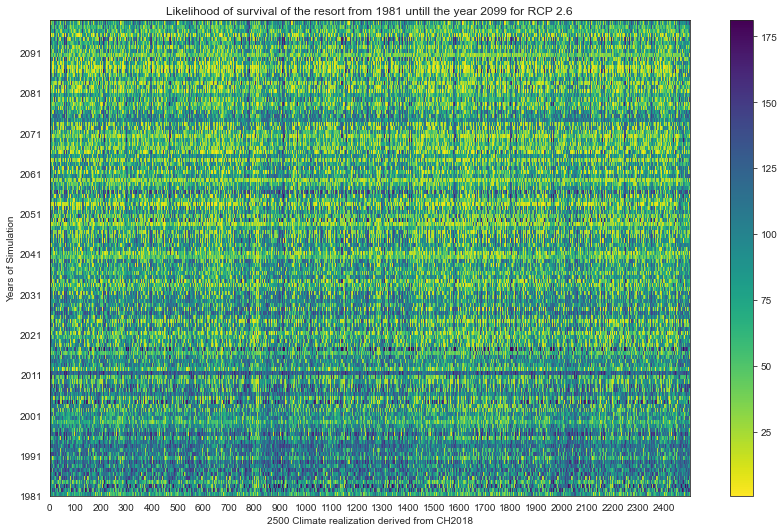

In [84]:
fig, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='viridis_r')
cb3 = fig.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)))
ax3.set_ylabel("Years of Simulation")
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6))

fig.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

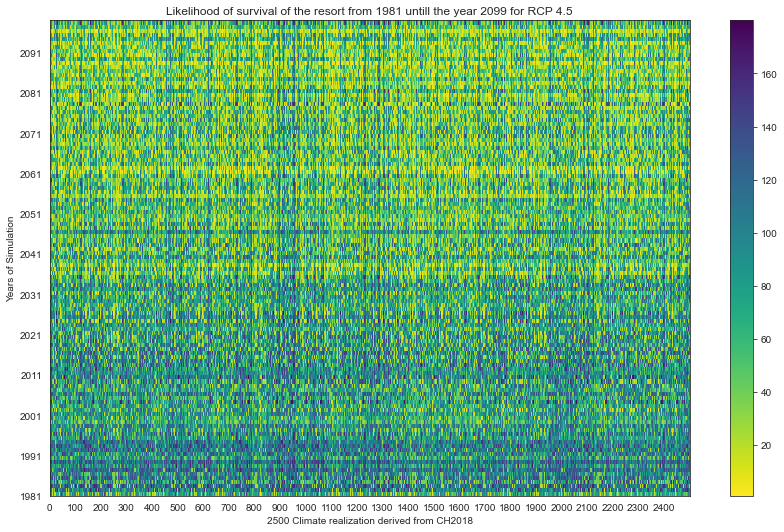

In [85]:
fig, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='viridis_r')
cb3 = fig.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)))
ax3.set_ylabel("Years of Simulation")
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5))

fig.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

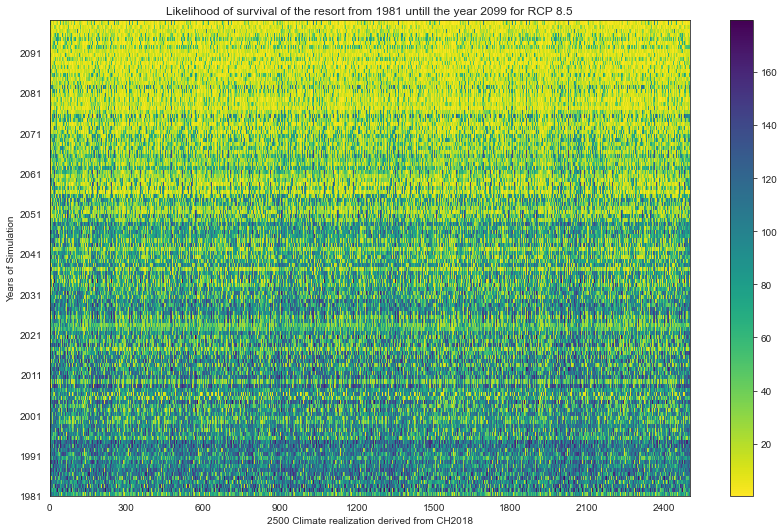

In [86]:
fig, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='viridis_r')

cb3 = fig.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)))
ax3.set_ylabel("Years of Simulation")
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5))

fig.tight_layout()
plt.show()

## 3 years of not having good snow days

In [87]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

In [88]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver2_26_5'],sc_2_['isOverSnow_sc_Ver1_26_11'],sc_3_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_4_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_5_['isOverSnow_sc_Ver2_26_10'],sc_6_['isOverSnow_sc_Ver1_26_12'],sc_7_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_8_['isOverSnow_sc_Ver1_26_3'],sc_9_['isOverSnow_sc_Ver2_26_2'],sc_10_['isOverSnow_sc_Ver2_26_2'],sc_11_['isOverSnow_sc_Ver1_26_11'],sc_12_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_13_['isOverSnow_sc_Ver2_26_3'],sc_14_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_15_['isOverSnow_sc_Ver2_26_8'],sc_16_['isOverSnow_sc_Ver2_26_5'],sc_17_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_18_['isOverSnow_sc_Ver1_26_4'],sc_19_['isOverSnow_sc_Ver2_26_3'],sc_20_['isOverSnow_sc_Ver1_26_11'],sc_21_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_22_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_23_['isOverSnow_sc_Ver1_26_4'],sc_24_['isOverSnow_sc_Ver2_26_4'],sc_25_['isOverSnow_sc_Ver2_26_6'],sc_26_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_27_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_28_['isOverSnow_sc_Ver2_26_6'],sc_29_['isOverSnow_sc_Ver2_26_7'],sc_30_['isOverSnow_sc_Ver2_26_7'],sc_31_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_32_['isOverSnow_sc_Ver1_26_8'],sc_33_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],...,sc_2467_['isOverSnow_sc_Ver2_26_4'],sc_2468_['isOverSnow_sc_Ver2_26_6'],sc_2469_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2470_['isOverSnow_sc_Ver2_26_6'],sc_2471_['isOverSnow_sc_Ver2_26_7'],sc_2472_['isOverSnow_sc_Ver2_26_7'],sc_2473_['isOverSnow_sc_Ver1_26_11'],sc_2474_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2475_['isOverSnow_sc_Ver1_26_8'],sc_2476_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2477_['isOverSnow_sc_Ver2_26_12'],sc_2478_['isOverSnow_sc_Ver1_26_10'],sc_2479_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2480_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2481_['isOverSnow_sc_Ver2_26_9'],sc_2482_['isOverSnow_sc_Ver1_26_5'],sc_2483_['isOverSnow_sc_Ver1_26_6'],sc_2484_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2485_['isOverSnow_sc_Ver2_26_6'],sc_2486_['isOverSnow_sc_Ver2_26_7'],sc_2487_['isOverSnow_sc_Ver1_26_10'],sc_2488_['isOverSnow_sc_Ver2_26_8'],sc_2489_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2490_['isOverSnow_sc_Ver1_26_6'],sc_2491_['isOverSnow_sc_Ver2_26_2'],sc_2492_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2493_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver2_26_7'],sc_2495_['isOverSnow_sc_Ver1_26_8'],sc_2496_['isOverSnow_sc_Ver1_26_11'],sc_2497_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2498_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2499_['isOverSnow_sc_Ver1_26_6'],sc_2500_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp']
0,1981-1982,14.252297553566095,58.78424090478251,132.88896720917745,80.3975589794783,136.5395624537052,34.3296084535804,97.70617605236149,30.591140269289976,85.62990393269094,57.20430512413728,37.32472544766984,77.41665853738922,90.5214568525714,100.06983640744778,59.73508361168701,15.9321677933297,52.616428248061496,50.42360609465524,82.60255414594103,64.63283362069164,98.9852635162791,98.38265432066709,33.06342318455567,67.86120151218161,120.65138656537692,126.18105858026603,94.89248826251284,88.32916517457079,79.99789424281005,47.81735095807673,53.35597329453751,103.91771085475139,62.35902047874785,...,69.23628484651742,122.33880680401178,95.67697716419937,90.46577678288236,81.36786458391754,48.97401429723335,44.84409464202877,54.43404037259353,105.51220737158405,63.86488552669316,82.29791394696969,93.5827826271603,81.63033196764277,73.97038052857933,70.87068445143015,18.589230336409667,109.83835335780283,75.48416779283176,103.35571709723239,79.72697230954364,90.58289074359305,60.890742003676266,106.779877486251,126.77648998034806,86.02468819101851,92.02151696657806,44.95461416860898,77.4578757437299,95.8418879791556

In [89]:
type(df26_all)

pandas.core.frame.DataFrame

In [90]:
df26_allColumns = df26_all.columns

In [91]:
df26_all[df26_allColumns[1]].iloc[0]

'14.252297553566095'

In [92]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver2_26_5'],sc_2_['isOverSnow_sc_Ver1_26_11'],sc_3_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_4_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_5_['isOverSnow_sc_Ver2_26_10'],sc_6_['isOverSnow_sc_Ver1_26_12'],sc_7_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_8_['isOverSnow_sc_Ver1_26_3'],sc_9_['isOverSnow_sc_Ver2_26_2'],sc_10_['isOverSnow_sc_Ver2_26_2'],sc_11_['isOverSnow_sc_Ver1_26_11'],sc_12_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_13_['isOverSnow_sc_Ver2_26_3'],sc_14_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_15_['isOverSnow_sc_Ver2_26_8'],sc_16_['isOverSnow_sc_Ver2_26_5'],sc_17_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_18_['isOverSnow_sc_Ver1_26_4'],sc_19_['isOverSnow_sc_Ver2_26_3'],sc_20_['isOverSnow_sc_Ver1_26_11'],sc_21_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_22_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_23_['isOverSnow_sc_Ver1_26_4'],sc_24_['isOverSnow_sc_Ver2_26_4'],sc_25_['isOverSnow_sc_Ver2_26_6'],sc_26_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_27_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_28_['isOverSnow_sc_Ver2_26_6'],sc_29_['isOverSnow_sc_Ver2_26_7'],sc_30_['isOverSnow_sc_Ver2_26_7'],sc_31_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_32_['isOverSnow_sc_Ver1_26_8'],sc_33_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],...,sc_2467_['isOverSnow_sc_Ver2_26_4'],sc_2468_['isOverSnow_sc_Ver2_26_6'],sc_2469_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2470_['isOverSnow_sc_Ver2_26_6'],sc_2471_['isOverSnow_sc_Ver2_26_7'],sc_2472_['isOverSnow_sc_Ver2_26_7'],sc_2473_['isOverSnow_sc_Ver1_26_11'],sc_2474_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2475_['isOverSnow_sc_Ver1_26_8'],sc_2476_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2477_['isOverSnow_sc_Ver2_26_12'],sc_2478_['isOverSnow_sc_Ver1_26_10'],sc_2479_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2480_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2481_['isOverSnow_sc_Ver2_26_9'],sc_2482_['isOverSnow_sc_Ver1_26_5'],sc_2483_['isOverSnow_sc_Ver1_26_6'],sc_2484_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2485_['isOverSnow_sc_Ver2_26_6'],sc_2486_['isOverSnow_sc_Ver2_26_7'],sc_2487_['isOverSnow_sc_Ver1_26_10'],sc_2488_['isOverSnow_sc_Ver2_26_8'],sc_2489_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2490_['isOverSnow_sc_Ver1_26_6'],sc_2491_['isOverSnow_sc_Ver2_26_2'],sc_2492_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2493_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver2_26_7'],sc_2495_['isOverSnow_sc_Ver1_26_8'],sc_2496_['isOverSnow_sc_Ver1_26_11'],sc_2497_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2498_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2499_['isOverSnow_sc_Ver1_26_6'],sc_2500_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp']
0,1981-1982,14.252297553566095,58.78424090478251,132.88896720917745,80.3975589794783,136.5395624537052,34.3296084535804,97.70617605236149,30.591140269289976,85.62990393269094,57.20430512413728,37.32472544766984,77.41665853738922,90.5214568525714,100.06983640744778,59.73508361168701,15.9321677933297,52.616428248061496,50.42360609465524,82.60255414594103,64.63283362069164,98.9852635162791,98.38265432066709,33.06342318455567,67.86120151218161,120.65138656537692,126.18105858026603,94.89248826251284,88.32916517457079,79.99789424281005,47.81735095807673,53.35597329453751,103.91771085475139,62.35902047874785,...,69.23628484651742,122.33880680401178,95.67697716419937,90.46577678288236,81.36786458391754,48.97401429723335,44.84409464202877,54.43404037259353,105.51220737158405,63.86488552669316,82.29791394696969,93.5827826271603,81.63033196764277,73.97038052857933,70.87068445143015,18.589230336409667,109.83835335780283,75.48416779283176,103.35571709723239,79.72697230954364,90.58289074359305,60.890742003676266,106.779877486251,126.77648998034806,86.02468819101851,92.02151696657806,44.95461416860898,77.4578757437299,95.8418879791556

In [93]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [94]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver2_26_5'],sc_2_['isOverSnow_sc_Ver1_26_11'],sc_3_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_4_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_5_['isOverSnow_sc_Ver2_26_10'],sc_6_['isOverSnow_sc_Ver1_26_12'],sc_7_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_8_['isOverSnow_sc_Ver1_26_3'],sc_9_['isOverSnow_sc_Ver2_26_2'],sc_10_['isOverSnow_sc_Ver2_26_2'],sc_11_['isOverSnow_sc_Ver1_26_11'],sc_12_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_13_['isOverSnow_sc_Ver2_26_3'],sc_14_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_15_['isOverSnow_sc_Ver2_26_8'],sc_16_['isOverSnow_sc_Ver2_26_5'],sc_17_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_18_['isOverSnow_sc_Ver1_26_4'],sc_19_['isOverSnow_sc_Ver2_26_3'],sc_20_['isOverSnow_sc_Ver1_26_11'],sc_21_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_22_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_23_['isOverSnow_sc_Ver1_26_4'],sc_24_['isOverSnow_sc_Ver2_26_4'],sc_25_['isOverSnow_sc_Ver2_26_6'],sc_26_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_27_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_28_['isOverSnow_sc_Ver2_26_6'],sc_29_['isOverSnow_sc_Ver2_26_7'],sc_30_['isOverSnow_sc_Ver2_26_7'],sc_31_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_32_['isOverSnow_sc_Ver1_26_8'],sc_33_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],...,sc_2467_['isOverSnow_sc_Ver2_26_4'],sc_2468_['isOverSnow_sc_Ver2_26_6'],sc_2469_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2470_['isOverSnow_sc_Ver2_26_6'],sc_2471_['isOverSnow_sc_Ver2_26_7'],sc_2472_['isOverSnow_sc_Ver2_26_7'],sc_2473_['isOverSnow_sc_Ver1_26_11'],sc_2474_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2475_['isOverSnow_sc_Ver1_26_8'],sc_2476_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2477_['isOverSnow_sc_Ver2_26_12'],sc_2478_['isOverSnow_sc_Ver1_26_10'],sc_2479_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2480_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2481_['isOverSnow_sc_Ver2_26_9'],sc_2482_['isOverSnow_sc_Ver1_26_5'],sc_2483_['isOverSnow_sc_Ver1_26_6'],sc_2484_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2485_['isOverSnow_sc_Ver2_26_6'],sc_2486_['isOverSnow_sc_Ver2_26_7'],sc_2487_['isOverSnow_sc_Ver1_26_10'],sc_2488_['isOverSnow_sc_Ver2_26_8'],sc_2489_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2490_['isOverSnow_sc_Ver1_26_6'],sc_2491_['isOverSnow_sc_Ver2_26_2'],sc_2492_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2493_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver2_26_7'],sc_2495_['isOverSnow_sc_Ver1_26_8'],sc_2496_['isOverSnow_sc_Ver1_26_11'],sc_2497_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2498_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2499_['isOverSnow_sc_Ver1_26_6'],sc_2500_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp']
0,1981-1982,14.252297553566095,58.78424090478251,132.88896720917745,80.3975589794783,136.5395624537052,34.3296084535804,97.70617605236149,30.591140269289976,85.62990393269094,57.20430512413728,37.32472544766984,77.41665853738922,90.5214568525714,100.06983640744778,59.73508361168701,15.9321677933297,52.616428248061496,50.42360609465524,82.60255414594103,64.63283362069164,98.9852635162791,98.38265432066709,33.06342318455567,67.86120151218161,120.65138656537692,126.18105858026603,94.89248826251284,88.32916517457079,79.99789424281005,47.81735095807673,53.35597329453751,103.91771085475139,62.35902047874785,...,69.23628484651742,122.33880680401178,95.67697716419937,90.46577678288236,81.36786458391754,48.97401429723335,44.84409464202877,54.43404037259353,105.51220737158405,63.86488552669316,82.29791394696969,93.5827826271603,81.63033196764277,73.97038052857933,70.87068445143015,18.589230336409667,109.83835335780283,75.48416779283176,103.35571709723239,79.72697230954364,90.58289074359305,60.890742003676266,106.779877486251,126.77648998034806,86.02468819101851,92.02151696657806,44.95461416860898,77.4578757437299,95.8418879791556

In [95]:
print(len(T1RCP26[:]))
print(len(T1RCP45[:]))
print(len(T1RCP85[:]))

2501
2501
2501


In [96]:
type(T1RCP85)

numpy.ndarray

In [97]:
x_axis = np.arange(1,7504)

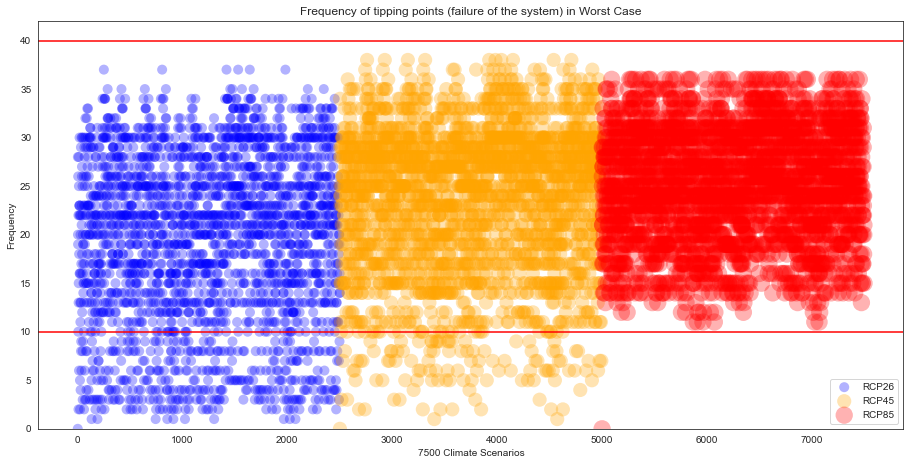

In [98]:
fig, ax1 = plt.subplots(figsize=(15.5,7.5))

ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 2)],T1RCP26[:], s = 100, c='b' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 2: len(matrix_GoodDays26) + len(matrix_GoodDays45) + 3],T1RCP45[:], s = 200, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 3:7504],T1RCP85[:-1], s = 300, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points (failure of the system) in Worst Case")
ax1.set_ylabel("Frequency")
ax1.set_xlabel("7500 Climate Scenarios")
ax1.set_ylim(bottom=0, top =42)
ax1.axhline(y=10, color='red')
ax1.axhline(y=40, color='red')

ax1.legend()


fig.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [99]:
from scipy.integrate import simps

def area_max_min_df (df, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario, dx=1)
    areamin1 = trapz(min_scenario, dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario, dx=1)
    areamin2 = simps(min_scenario, dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [100]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [101]:
max_scenario.to_numpy()

array([99.94168077, 99.90712935, 99.99803241, 99.98504171, 99.88679273,
       99.99177271, 99.9672112 , 99.95862197, 99.94979672, 99.9078141 ,
       99.97634898, 99.92244486, 99.99087131, 99.92589256, 99.94689669,
       99.98924809, 99.96840856, 99.99604273, 99.99404028, 99.99504003,
       99.98963025, 99.81545412, 99.99285994, 99.99032512, 99.95777586,
       99.87679892, 99.92635138, 99.99248838, 99.981228  , 99.99547326,
       99.9847025 , 99.81845987, 99.98103053, 99.99804194, 99.92010203,
       99.84451889, 99.69732119, 99.92978754, 99.91506004, 99.84019701,
       99.9572961 , 99.98132501, 99.97995095, 99.74242832, 99.94341359,
       99.95340846, 99.99759609, 99.98117495, 99.9981771 , 99.92004602,
       99.93022608, 99.96091424, 99.99012107, 99.9873792 , 99.89397788,
       99.99692077, 99.99667668, 99.98646223, 99.9765327 , 99.82422975,
       99.63070655, 99.9267566 , 99.94845678, 99.98584977, 99.99071146,
       99.88939294, 99.91945289, 99.87825006, 99.91790819, 99.75

In [102]:
min_scenario.to_numpy()

array([100.01242831, 100.0063566 , 100.03646071, 100.00660064,
       100.00502103, 100.04255544, 100.03265607, 100.01500744,
       100.00367757,  10.00706673, 100.08293757, 100.03600113,
       100.00503776, 100.06614241,  10.02415744,  10.04386034,
       100.00530133, 100.02754525, 100.03718224, 100.02697638,
       100.01110853,  10.18442835, 100.0241991 , 100.07713338,
        10.00578193, 100.01567543, 100.38476386, 100.00732727,
       100.0331416 , 100.06687174, 100.02515664,  10.03045465,
       100.02782774, 100.00000139, 100.01315158, 100.01909941,
       100.02927981,  10.09676473,  10.0211584 , 100.00376917,
        10.03606325,  10.00401222,  10.01003533,  10.00705218,
        10.50552215, 100.1221438 ,  10.01987828, 100.00324415,
       100.03062669, 100.09272224,  10.02105008, 100.13229305,
        10.59416072,  10.0148995 ,  10.02795652, 100.06750078,
       100.16101929,  10.06554496, 100.07532649, 100.01353016,
        10.02824525,  10.00338838, 100.05755012,  10.03

In [103]:
max_scenario.shape

(118,)

In [104]:
print("Resort3 Worst Case")
area_max_min_df (df26_all, 118)
area_max_min_df (df45_all, 118)
area_max_min_df (df85_all, 118)

Resort3 Worst Case
Start************************************************************
Uncertainty Band1 =74.11 days
Uncertainty Band2 =74.14 days
****************************************End

Start************************************************************
Uncertainty Band1 =70.38 days
Uncertainty Band2 =70.35 days
****************************************End

Start************************************************************
Uncertainty Band1 =61.59 days
Uncertainty Band2 =61.59 days
****************************************End



## End